<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/HW1_Regression_with_inference_base_pt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Утилиты

## Импорты

In [1]:
import re
import warnings
import pickle

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import phik
import random
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import (
    LinearRegression,
    LassoCV,
    Lasso,
    ElasticNet,
    Ridge
)
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from ydata_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline

random.seed(42)
np.random.seed(42)

%matplotlib inline
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)


## Вспомогательные функции

In [2]:
def units_of_measurement_cleaner(df: pd.DataFrame) -> None:
    '''
    Очистка единиц измерения в столбцах 'mliage', 'engine', 'max_power
    '''
    # df = df.copy()
    units_of_measurement_dict = {
        'mileage': 'kmpl',
        'engine': 'CC',
        'max_power': 'bhp'
    }
    for col in units_of_measurement_dict.keys():
        unit = units_of_measurement_dict[col]
        try:
            df[col] = df[col].str.replace(unit, '').str.strip()
            df[col] = df[col].astype(float)
        except Exception as e:
            print(col, unit, e)
            df[col] = pd.to_numeric(df[col], errors='coerce')
            continue

In [3]:
def torque_cleaner(df: pd.DataFrame) -> None:
    '''
    Обработка столбца 'torque'
    '''
    torque = df['torque'].str.lower().str.strip().str.replace(',', '.')

    torque_nm = []
    torque_rpm = []
    
    for val in torque:
        if val in [np.nan]:
            torque_nm.append(np.nan)
            torque_rpm.append(np.nan)
            continue
        nm = re.search(r'([\d.]+)\s*nm', val)
        kgm = re.search(r'([\d.]+)\s*kgm', val)
        
        if nm:
            nm_val = float(nm.group(1))
        elif kgm:
            nm_val = float(kgm.group(1)) * 9.80665
        else:
            first_number = re.search(r'\b([\d.]+)\b', val)
            if first_number:
                float_first_number = float(first_number.group(1))
                if float_first_number > 45:
                    nm_val = float_first_number
                else:
                    nm_val = float_first_number * 9.80665
            else:
                continue
        
        torque_nm.append(nm_val)

        val  = val.replace('.', '')

        rpm_0 = re.search(r'([\d.]+)\s*rpm', val)
        rpm_1 = re.search(r'([\d.]+)\s*-\s*([\d.]+)\s*rpm', val)
        rpm_2 = re.search(r'([\d.]+)\s*\+\/-\s*([\d.]+)\s*rpm', val)
        rpm_3 = re.search(r'([\d.]+)\s*\(kgm@ rpm\)', val)
        rpm_4 = re.search(r'@\s*([\d.]+)', val)
        rpm_5 = re.search(r'\/\s*([\d.]+)', val)

        if rpm_1:
            rpm_val = np.array([rpm_1.group(1), rpm_1.group(2)]).astype(float).mean()
        elif rpm_2:
            rpm_val = float(rpm_2.group(1))
        elif rpm_0:
            rpm_val = float(rpm_0.group(1))
        elif rpm_3:
            rpm_val = float(rpm_3.group(1))
        elif rpm_4:
            rpm_val = float(rpm_4.group(1))
        elif rpm_5:
            rpm_val = float(rpm_5.group(1))
        else:
            rpm_val = np.nan

        torque_rpm.append(rpm_val)

    df['torque_nm'] = torque_nm
    df['torque_rpm'] = torque_rpm
    df.drop(columns=['torque'], axis=1, inplace=True)

In [4]:
def plotting_stat_graphs(
        df: pd.DataFrame,
        hue: str|None = None,
        hue_nunique_threshold: int = 5,
        discrete_threshold: int = 20,
) -> None:
    '''
    Отрисовка графиков и диаграмм основных распределений
    '''

    if hue and hue not in df.columns:
        print(f'{hue} нет в признаках')
        hue = None

    if hue:
        other_groups = (
            df[hue]
            .value_counts()[hue_nunique_threshold:]
        ).index
        if len(other_groups) > 0:
            df[hue] = df[hue].map({
                other_group: 'other' for other_group in other_groups
            })

    numeric_cols = pd.DataFrame(
        df.select_dtypes(include="number").nunique(), columns=["counts"]
    ).query("counts > @discrete_threshold")

    non_numeric_cols = pd.DataFrame(
        df.nunique(), columns=["counts"]
    ).query("counts <= @discrete_threshold")

    for col in numeric_cols.index:
        fig = plt.figure(figsize=(13, 8))
        grid = plt.GridSpec(4, 1, hspace=0.3, wspace=0)
        ax_hist = fig.add_subplot(grid[:3, 0], xticklabels=[])
        ax_boxplot = fig.add_subplot(grid[3, 0], yticklabels=[])
        sns.histplot(
            data=df, x=col, hue=hue, bins=50, kde=True, ax=ax_hist
        )
        ax_hist.set_title(f"Histogram of the distribution of a {col}")
        ax_hist.set_xlabel(None)
        ax_hist.set_ylabel("Frequency", fontsize=12)
        sns.boxplot(data=df, x=col, ax=ax_boxplot)
        ax_boxplot.set_title(f"{col} variable span diagram")
        ax_boxplot.set_xlabel(col, fontsize=12)
        plt.show()

    for col in non_numeric_cols.index:
        fig = plt.figure(figsize=(13, 5))
        plt.subplot(1, 2, 1)
        sns.countplot(
            y=col,
            data=df,
            hue=hue,
            order=df[col].value_counts().index,
        )
        plt.title(f"Barplot for {col}")
        plt.subplot(1, 2, 2)
        counts = df[col].value_counts()
        percentages = [f"{count / df.shape[0]:.2%}" for count in counts]
        labels = list(map(str, counts.index))
        legend_labels = [
            f"{label}: {percentage}"
            for label, percentage in zip(labels, percentages)
        ]
        colors = plt.cm.tab20.colors[: len(labels)]
        plt.pie(counts.values, colors=colors, startangle=90)
        plt.legend(
            legend_labels,
            title=col,
            bbox_to_anchor=(1.5, 1),
            loc="upper right",
        )
        plt.title(f"Distribution of {df[col].shape[0]} {col}'s values")
        plt.tight_layout()
        plt.show()


In [5]:
def get_metrics(y_train, pred_train, y_test, pred_test):
    print(f'R^2 на тренировочных данных: {r2_score(y_train, pred_train):.5f}')
    print(f'R^2 на тестовых данных: {r2_score(y_test, pred_test):.5f}')

    print()

    print(f'MSE на тренировочных данных: {mean_squared_error(y_train, pred_train):.5f}')
    print(f'MSE на тестовых данных: {mean_squared_error(y_test, pred_test):.5f}')
    print(f'MAE на тестовых данных: {mean_absolute_error(y_test, pred_test):.5f}')

    print()

    print(f'Cредняя цены на авто для трейна: {y_train.mean()}')

# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

> Фиксация сидов таким образом задает глобальное состояние всей среды (внутренних генераторов), в которой мы работаем. Используется для точной воспроизводиомости результатов при повторном запуске ноутбука. Это также позволяет не использовать random_state в основных библиотеках (таких как sklearn), так как по умолчанию значения должны браться как раз из глобальной среды

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [6]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

Посмотрим на 30 случайных строк тренировочного датасета

In [7]:
df_train.sample(30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


Посмотрим на 5 первых строк тестового датасета

In [8]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


И 5 последних строк тестового датасета

In [9]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


Посмотрим на наличие пропусков по признакам в тренировочном датасете

In [10]:
df_isna_train = df_train.isna().sum()

df_isna_train[df_isna_train > 0]

mileage      202
engine       202
max_power    196
torque       203
seats        202
dtype: int64

Проверим пропуски в тестовом датасете

In [11]:
df_isna_test = df_test.isna().sum()

df_isna_test[df_isna_test > 0]

mileage      19
engine       19
max_power    19
torque       19
seats        19
dtype: int64

Посмотрим сколько в данных явных дубликатов

In [12]:
duplicates_count_train = df_train.duplicated().sum()

print(f'В тренировочных данных {duplicates_count_train} дубликатов')

В тренировочных данных 985 дубликатов


In [13]:
duplicates_count_test = df_test.duplicated().sum()

print(f'В тестовых данных {duplicates_count_test} дубликата')

В тестовых данных 62 дубликата


> Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
>
> По случаным строкам тренировочного датасета можно сделать вывод об общей стркутуре данных - можно грубо оценить наличие пропусков, посмотреть на характерные значения признаков. Вывод первых и последних строк тестового датасета может дать представление о наборе данных - можно оценить изменились ли данные между началом и концом датасета, в сравнении с тренировочными данными можно посмотреть совпадает ли структура данных в целом, не отличается ли обработка или тип признаков.
>
> Однако все эти наблюдения быстрые и поверхностные. Для того, чтобы делать осмысленные выводы нам необходимо знать как именно составлялись оба датасета (если предварительно данные перемешивались, то нет смысла в первых и последних строках итд). В общем случае стоит добавить подсчет статистик и общую информацию о таблице

> Достаточно ли метода duplicated для анализа дубликатов? Почему?
>
> Нет, этого метода не достаточно. Этот метод выделяет только полные дубликаты по поданным в него признакам (по умолчанию по всем). Из-за этого при невнимательном использовании наличие уникального столбца может сделать результат ошибочным. 
>
> При этом чаще в данных имеются неявные дубликаты - искажения в записи определенных категориальных признаков, когда одна смысловая единица может иметь разные названия (например, запись через е и ё). Для признаков, где число уникальных значений позволяет провести ручной поиск таких аномалий, мы можем самостоятельно поправить данные. В случае с большим числом уникальных значений стоит провести стандартную нормализацию ('ё' -> 'е', ['-', '_'] -> ' ' итд), а затем стоит подумать об отборе только самых популярных значений, с приданием всем остальным одного значения, но подходы могут различаться в зависимости от стоящей задачи

Для получения общей информации для данных построим дашборд

In [14]:
profile = ProfileReport(df_train, title='Train data profile', explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 261.20it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

Мы увидели, что и в тестовых, и в тренировочных данных есть пропуски. Посмотрим еще раз в каких столбцах у нас есть пропуски

In [15]:
df_train[df_isna_train[df_isna_train > 0].index].head()

,mileage,engine,max_power,torque,seats
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


В данных у нас есть единицы измерения, что помешает посчитать медиану. В данных такая проблема есть только у столбцов mileage, engine, max_power - стоит просто перевести данные в числовой формат

In [16]:
units_of_measurement_cleaner(df_train)

mileage kmpl could not convert string to float: '17.3 km/kg'
max_power bhp could not convert string to float: ''


In [17]:
units_of_measurement_cleaner(df_test)

mileage kmpl could not convert string to float: '26.6 km/kg'


У нас два значения в тренировочных и одно в тестовых не смогли обработаться и были заменены на пропуски. Так как точно перевести единицы из km/kg в kmpl не получается (они относятся к разным типам двигателей), замена на медиану будет точнее для модели. Хотя такие значения можно было бы просто отбросить, так как это скорее выбросы для нашей задачи

Скорректируем значения 

In [18]:
torque_cleaner(df_train)
torque_cleaner(df_test)

Посмотрим на полученные столбцы, точнее на их статистики

Тренировочная выборка

In [19]:
df_train[['torque_nm', 'torque_rpm']].describe()

,torque_nm,torque_rpm
count,6796.000000,6768.000000
mean,177.224272,2901.214613
std,90.536550,996.642432
min,46.500000,1300.000000
25%,111.800000,2000.000000
50%,170.000000,2500.000000
75%,205.000000,4000.000000
max,789.000000,21800.000000


Посмотрим на аномально высокие значения torque_rpm. У нас всего одно такое значение. Заменим его на пропуск

In [20]:
df_train.loc[df_train['torque_rpm'] > 10000, 'torque_rpm'] = np.nan

Тестовая выборка

In [21]:
df_test[['torque_nm', 'torque_rpm']].describe()

,torque_nm,torque_rpm
count,981.000000,977.000000
mean,175.014063,2923.752303
std,89.710403,962.867297
min,48.000000,1470.000000
25%,110.000000,2125.000000
50%,170.000000,2500.000000
75%,209.000000,4000.000000
max,620.000000,5000.000000


Здесь все хорошо

Еще раз посмотрим на данные в измененных выборках

In [22]:
df_train.head(2)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque_nm,torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0,190.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0,250.0,2000.0


In [23]:
df_test.head(2)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque_nm,torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,7.0,260.0,2000.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,5.0,260.0,2125.0


Теперь можно провести заполнение пропусков медианой для столбцов 'mileage', 'engine', 'max_power', 'seats', 'torque_nm', 'torque_rpm' 

In [24]:
median_cols = ['mileage', 'engine', 'max_power', 'seats', 'torque_nm',
               'torque_rpm']

In [25]:
preprocessor = ColumnTransformer([
    ('median_imputer', SimpleImputer(strategy='median'), median_cols)
    ], 
    remainder='passthrough', 
    verbose_feature_names_out=False
).set_output(transform="pandas")

df_train = preprocessor.fit_transform(df_train)
df_test = preprocessor.transform(df_test)

Посмотрим остались ли пропуски в данных

In [26]:
print('Train')
display(df_train.isna().sum().sort_values(ascending=False))
print('Test')
display(df_test.isna().sum().sort_values(ascending=False))

Train


mileage          0
engine           0
max_power        0
seats            0
torque_nm        0
torque_rpm       0
name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
dtype: int64

Test


mileage          0
engine           0
max_power        0
seats            0
torque_nm        0
torque_rpm       0
name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
dtype: int64

От пропусков избавились

### **Задание 2 (0.5 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


Сначала удалим из данных явные дубликаты

In [27]:
df_train.drop_duplicates(inplace=True)
df_test.drop_duplicates(inplace=True)

Посмотрим есть ли в данных объекты с одинаковым признаковым описанием

In [28]:
df_train[df_train.drop(columns=['selling_price']).duplicated()]

,mileage,engine,max_power,seats,torque_nm,torque_rpm,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
268,19.10,1197.0,85.80,5.0,114.0,4000.0,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner
370,16.78,1995.0,190.00,5.0,400.0,2125.0,BMW X4 M Sport X xDrive20d,2019,5400000,7500,Diesel,Dealer,Automatic,First Owner
444,22.74,796.0,47.30,5.0,69.0,3500.0,Maruti Alto 800 VXI,2016,270000,50000,Petrol,Individual,Manual,First Owner
766,25.44,936.0,57.60,5.0,150.0,1750.0,Chevrolet Beat Diesel LT,2012,200000,70000,Diesel,Individual,Manual,Second Owner
1000,19.70,796.0,46.30,5.0,62.0,3000.0,Maruti Alto LXI,2005,80000,40000,Petrol,Individual,Manual,Second Owner
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6815,22.70,799.0,53.64,5.0,72.0,4386.0,Datsun RediGO T Option,2016,200000,35000,Petrol,Individual,Manual,First Owner
6891,24.70,796.0,47.30,5.0,69.0,3500.0,Maruti Alto 800 LXI,2017,270000,35000,Petrol,Individual,Manual,First Owner
6906,22.90,1248.0,74.00,5.0,190.0,2000.0,Maruti Swift VDI,2012,416000,90000,Diesel,Individual,Manual,Second Owner
6947,18.00,995.0,62.00,5.0,90.3,4200.0,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner


In [29]:
df_test[df_test.drop(columns=['selling_price']).duplicated()]

,mileage,engine,max_power,seats,torque_nm,torque_rpm,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
221,21.50,1498.0,108.50,5.0,250.0,2250.0,Volkswagen Vento 1.5 Highline Plus AT 16 Alloy,2018,885000,75000,Diesel,Individual,Automatic,First Owner
725,24.70,796.0,47.30,5.0,69.0,3500.0,Maruti Alto 800 LXI,2018,310000,30000,Petrol,Individual,Manual,First Owner
857,21.21,1197.0,81.80,5.0,113.0,4200.0,Maruti Swift Dzire VXI 1.2,2018,650000,15000,Petrol,Individual,Manual,First Owner
892,22.90,1248.0,74.00,5.0,190.0,2000.0,Maruti Swift VDI,2013,409999,100000,Diesel,Individual,Manual,Third Owner
906,18.20,1248.0,73.74,7.0,172.5,1750.0,Chevrolet Enjoy 1.3 TCDi LS 7,2016,420000,110000,Diesel,Individual,Manual,Second Owner
919,20.40,1197.0,81.80,5.0,113.0,4200.0,Maruti Swift VXI Optional,2015,450000,30000,Petrol,Individual,Manual,First Owner
924,20.54,1598.0,103.60,5.0,250.0,2000.0,Volkswagen Vento Diesel Highline,2011,300000,100000,Diesel,Individual,Manual,Second Owner


У нас есть 174 и 7 повторяющихся объектов в тренировочной и тестовой данных соответственно. При этом полные дубликаты мы уже удалили, так что для этих объектов цены на автомобили отличались. Удалим дубликаты, оставляя только первое вхождение объекта

In [30]:
df_train = df_train.drop_duplicates(
    subset=df_train.columns.difference(['selling_price']), 
    keep='first'
)

df_test = df_test.drop_duplicates(
    subset=df_test.columns.difference(['selling_price']), 
    keep='first'
)

Теперь обновим индексацию после удаления явных дублиактов

In [31]:
df_train.reset_index(inplace=True, drop=True)
df_test.reset_index(inplace=True, drop=True)

Проверку пропускаем, так как мы обработали `torque`

In [32]:
# assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [33]:
# Это задание я увидел после того, как все обработал уже. Задание сделано выше

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

Приведем столбцы ``engnine`` и ``seats`` к `int`

In [34]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [35]:
print('Train')
display(df_train.head(2))
print('Test')
display(df_test.head(2))

Train


,mileage,engine,max_power,seats,torque_nm,torque_rpm,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
0,23.40,1248,74.00,5,190.0,2000.0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner
1,21.14,1498,103.52,5,250.0,2000.0,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner


Test


,mileage,engine,max_power,seats,torque_nm,torque_rpm,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
0,14.0,2498,112.0,7,260.0,2000.0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner
1,21.5,1497,108.5,5,260.0,2125.0,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner


### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [36]:
print('Числовые статистики для тренировочных данных')
display(df_train.describe())

print('Числовые статистики для тестовых данных')
display(df_test.describe())

print('Категориальные статистики для тренировочных данных')
display(df_train.describe(exclude='number'))

print('Категораильные статистики для тестовых данных')
display(df_test.describe(exclude='number'))

Числовые статистики для тренировочных данных


,mileage,engine,max_power,seats,torque_nm,torque_rpm,year,selling_price,km_driven
count,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5.840000e+03,5.840000e+03
mean,19.394733,1429.448973,87.910782,5.426712,171.655090,2863.350257,2013.428425,5.229601e+05,7.395224e+04
std,3.919005,485.662834,31.639585,0.982344,83.780456,941.269989,4.095622,5.354320e+05,6.007114e+04
min,0.000000,624.000000,0.000000,2.000000,46.500000,1300.000000,1983.000000,2.999900e+04,1.000000e+00
25%,17.000000,1197.000000,68.000000,5.000000,111.800000,2000.000000,2011.000000,2.500000e+05,3.900000e+04
50%,19.300000,1248.000000,81.860000,5.000000,170.000000,2500.000000,2014.000000,4.050000e+05,7.000000e+04
75%,22.070000,1498.000000,99.000000,5.000000,200.000000,3775.000000,2017.000000,6.400000e+05,1.000000e+05
max,42.000000,3604.000000,400.000000,14.000000,789.000000,5000.000000,2020.000000,1.000000e+07,2.360457e+06


Числовые статистики для тестовых данных


,mileage,engine,max_power,seats,torque_nm,torque_rpm,year,selling_price,km_driven
count,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000,9.310000e+02,931.000000
mean,19.363577,1435.484425,88.564694,5.409237,170.817988,2899.609023,2013.506982,5.501182e+05,72786.747583
std,3.952287,515.908793,32.715274,0.924622,84.516868,939.743081,4.043408,5.987156e+05,48823.924040
min,0.000000,624.000000,34.200000,4.000000,48.000000,1470.000000,1995.000000,3.100000e+04,1303.000000
25%,16.510000,1196.500000,68.050000,5.000000,110.000000,2125.000000,2011.000000,2.500000e+05,39000.000000
50%,19.300000,1248.000000,82.000000,5.000000,170.000000,2500.000000,2014.000000,4.200000e+05,65000.000000
75%,22.320000,1498.000000,100.000000,5.000000,200.055660,4000.000000,2017.000000,6.500000e+05,100000.000000
max,28.400000,3604.000000,280.000000,9.000000,620.000000,5000.000000,2020.000000,6.000000e+06,375000.000000


Категориальные статистики для тренировочных данных


,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


Категораильные статистики для тестовых данных


,name,fuel,seller_type,transmission,owner
count,931,931,931,931,931
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,14,498,813,839,562


> Описательные статистики  для количественных признаков практически совпадают между train и test. Это может говорить о корректности разбиения данных - нет устаревших, способ сбора не изменился. На таких данных действительно имеет смысл строить модель
>
> В условиях масштаба статистики категориальных также близки

In [37]:
assert df_train.shape == (5840, 14) # мы добавили лишний признак, когда обрабатывали torque

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

Отрисыем основные распределения для признаков в тренировочных данных

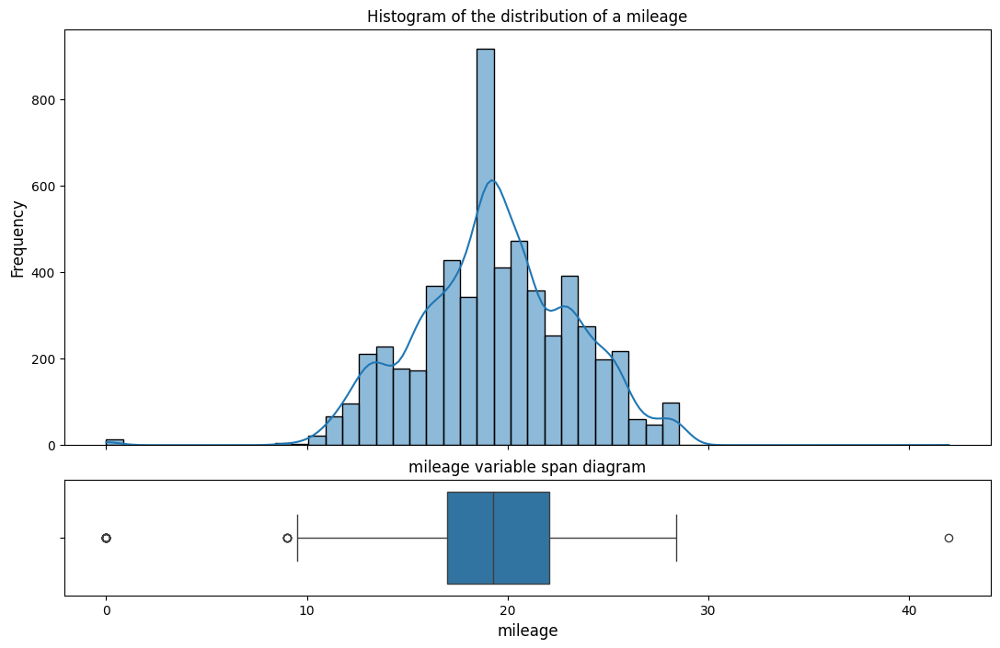

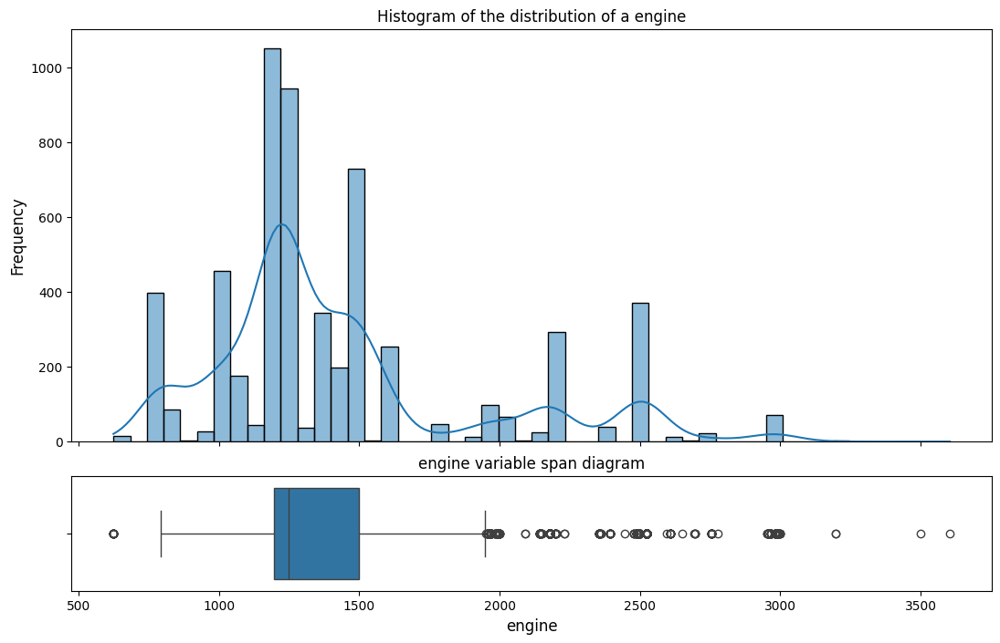

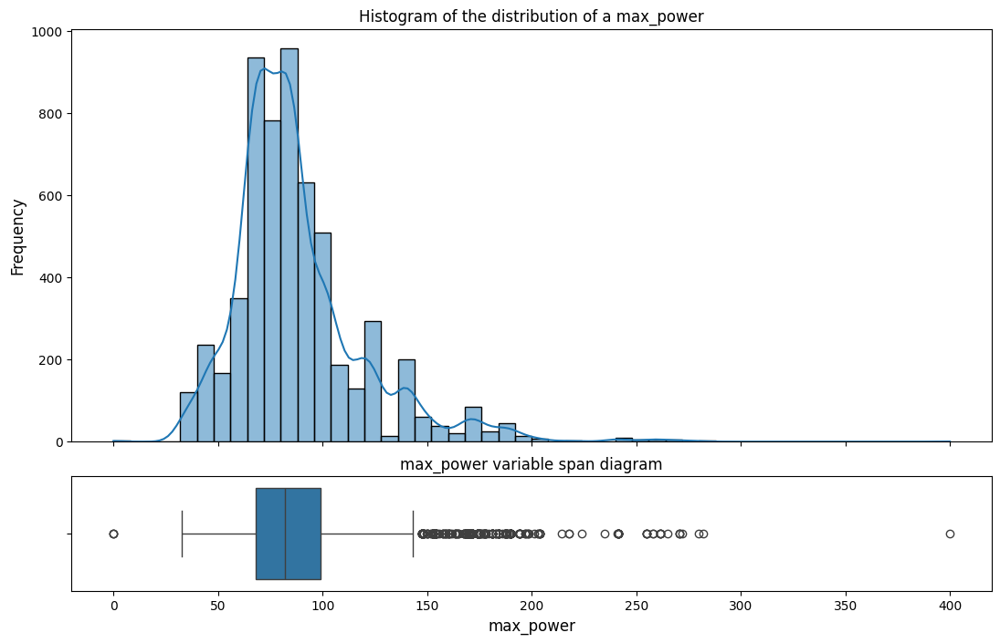

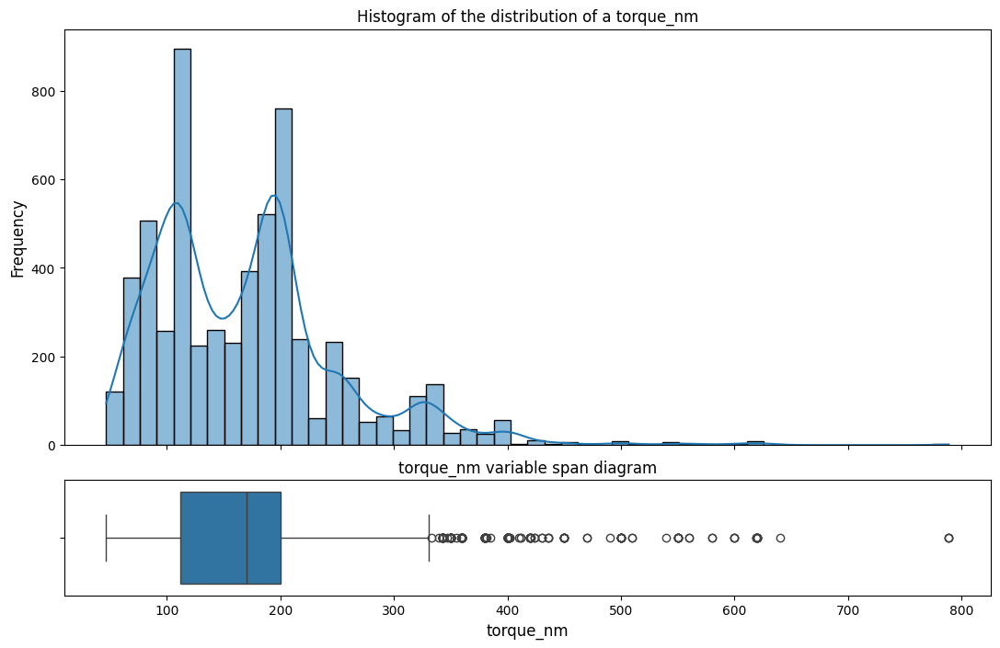

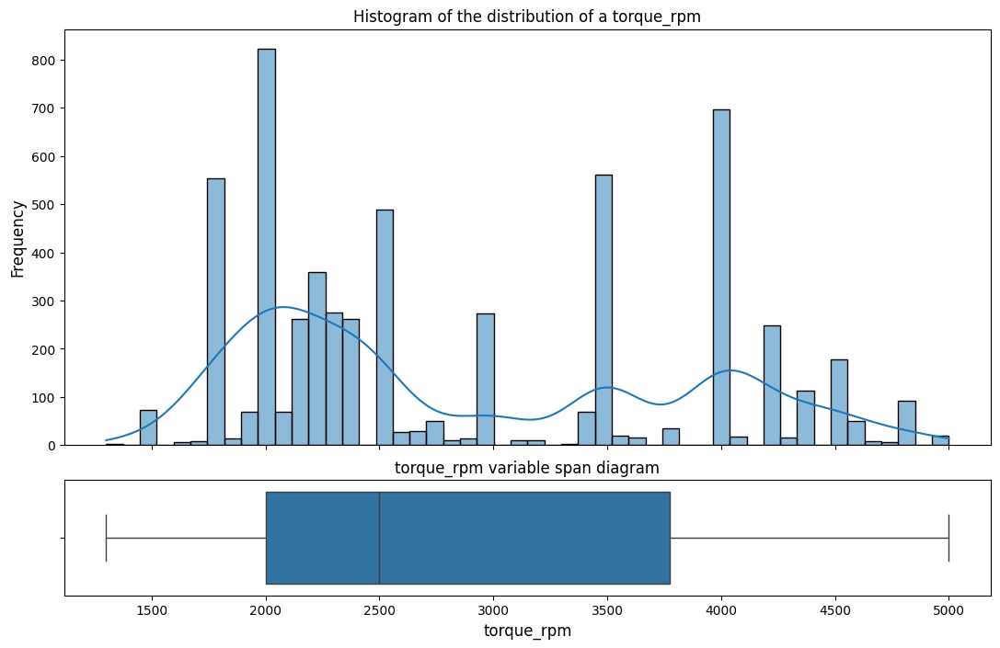

...

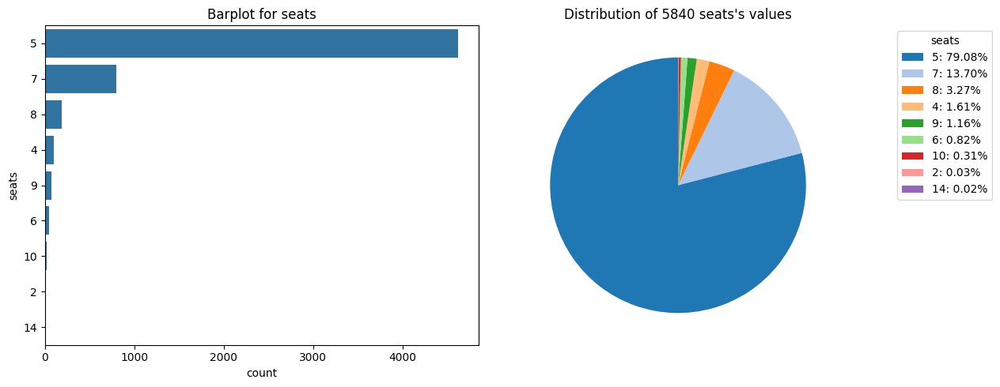

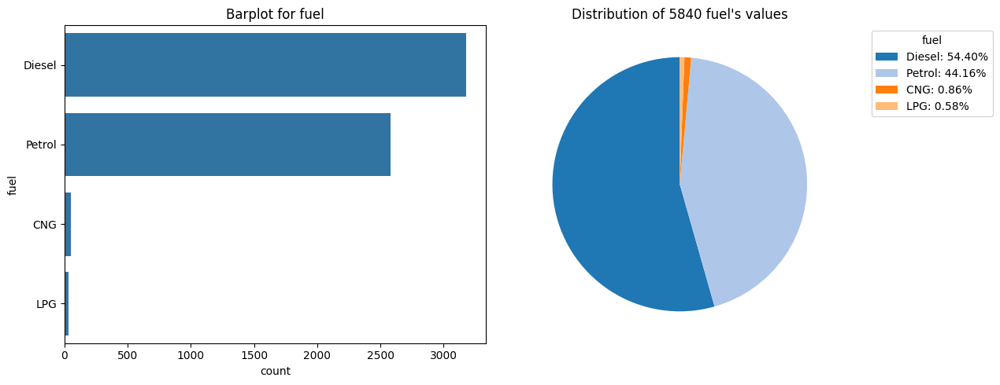

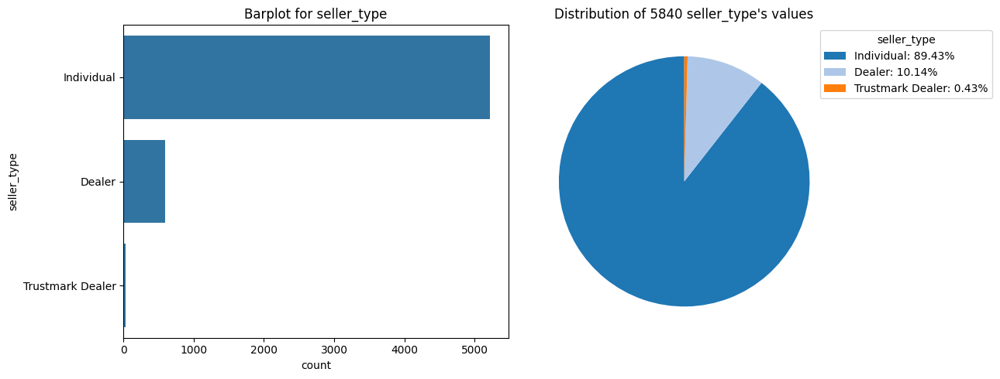

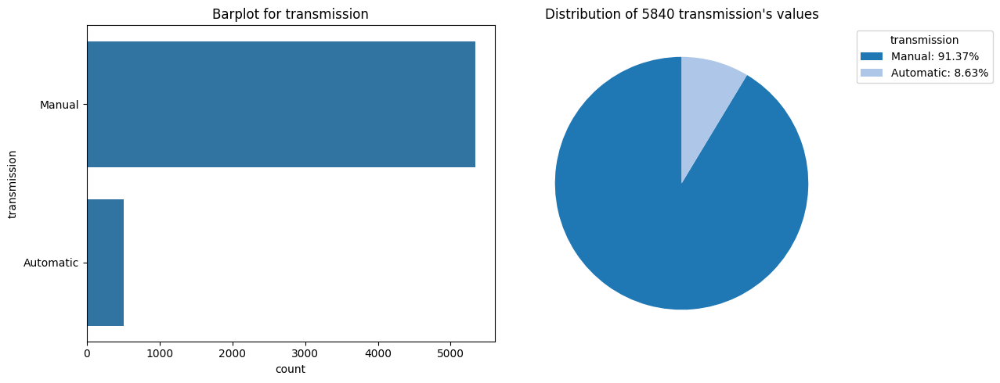

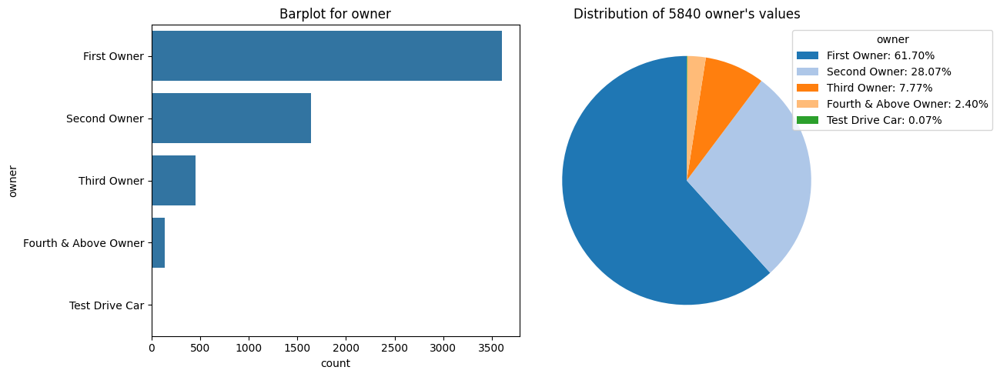

In [38]:
plotting_stat_graphs(df_train)

Отрисыем те же распределения для тестовых данных

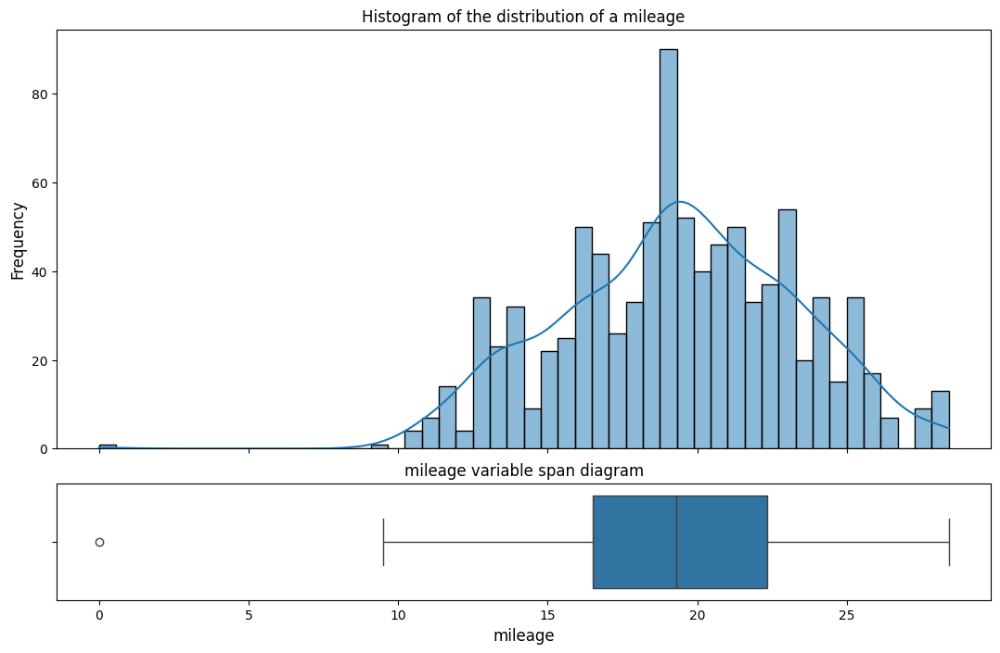

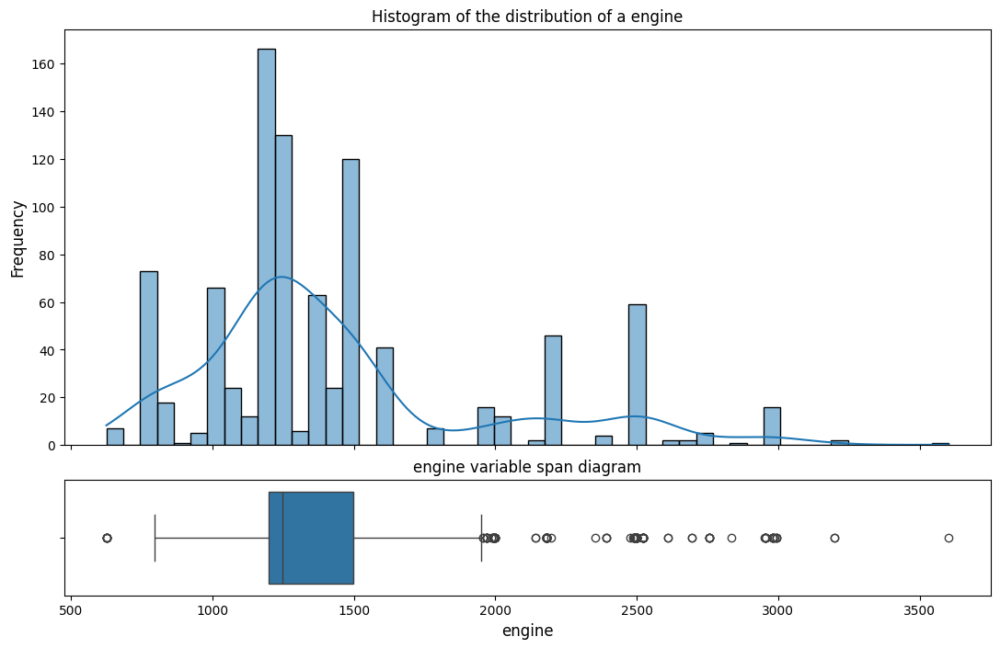

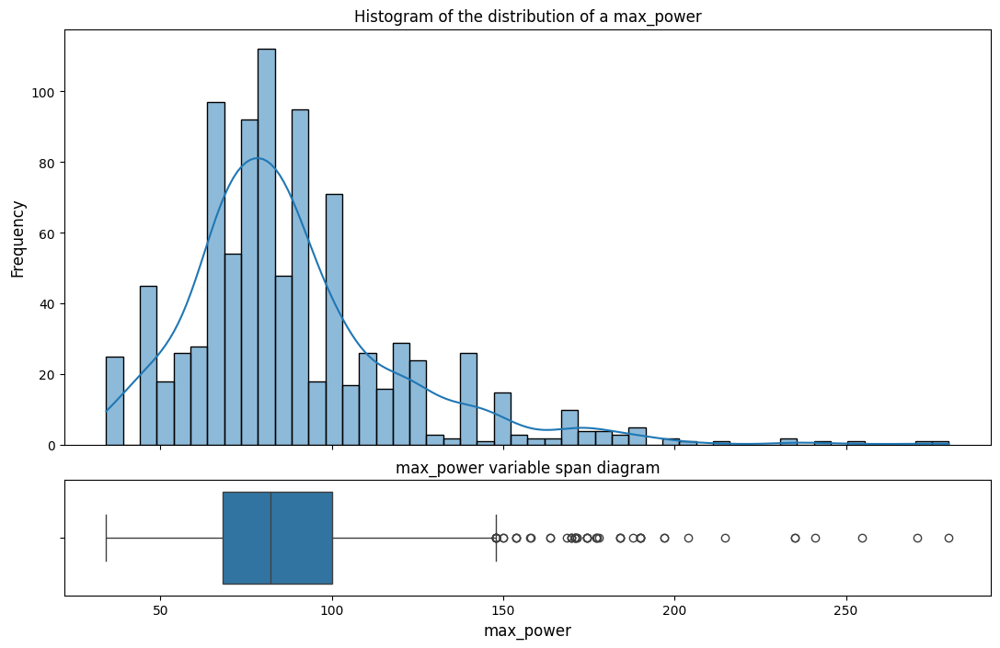

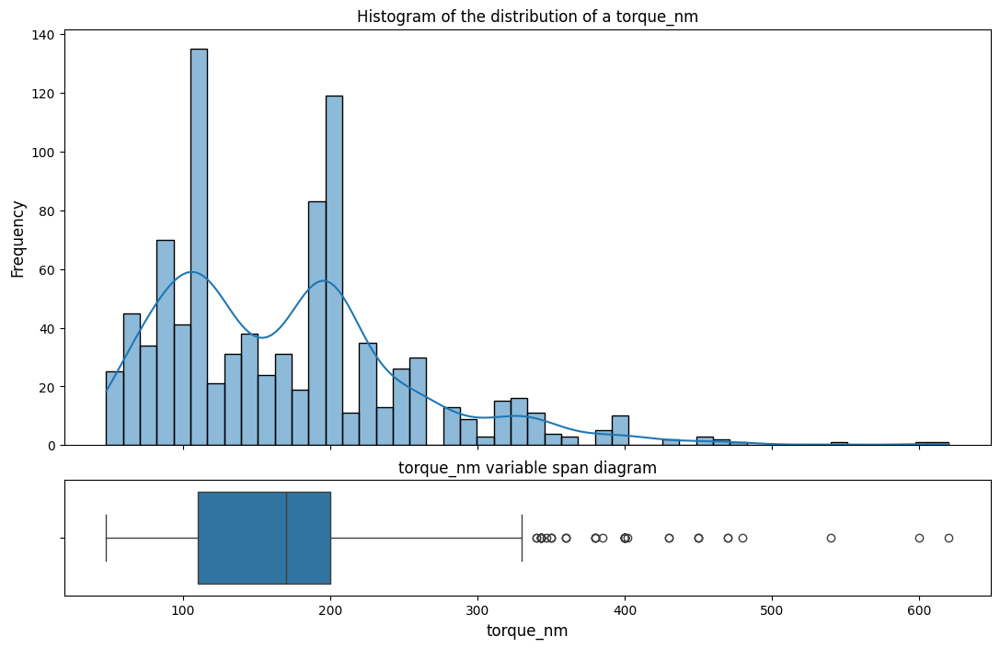

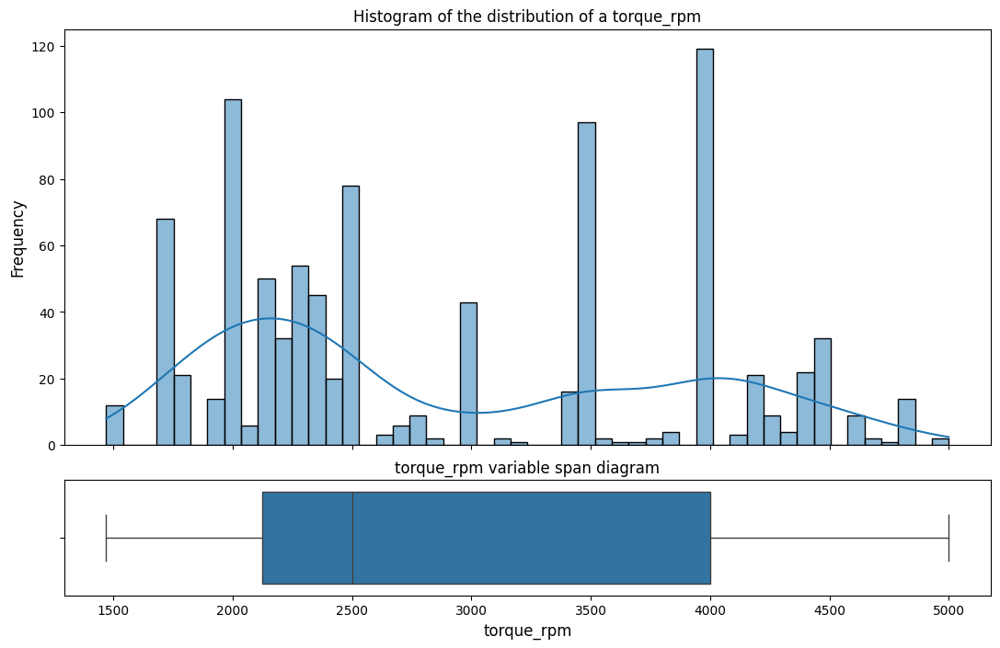

...

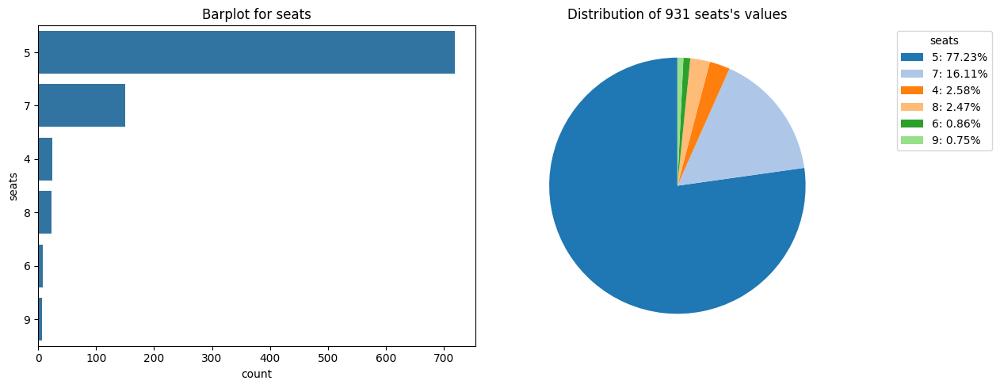

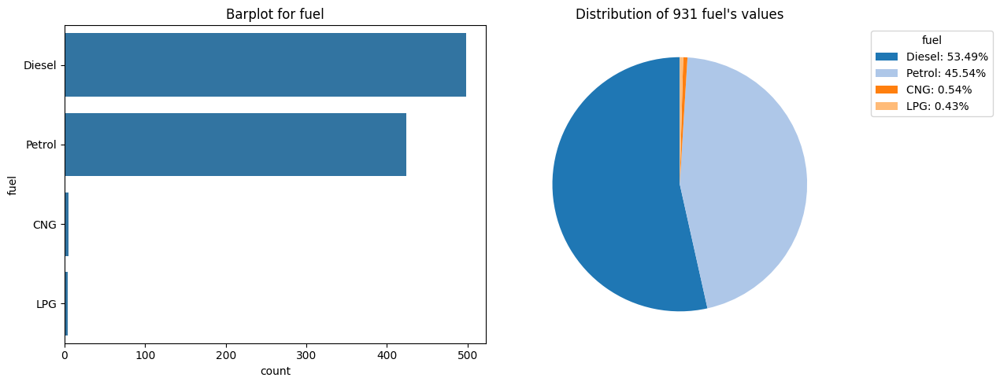

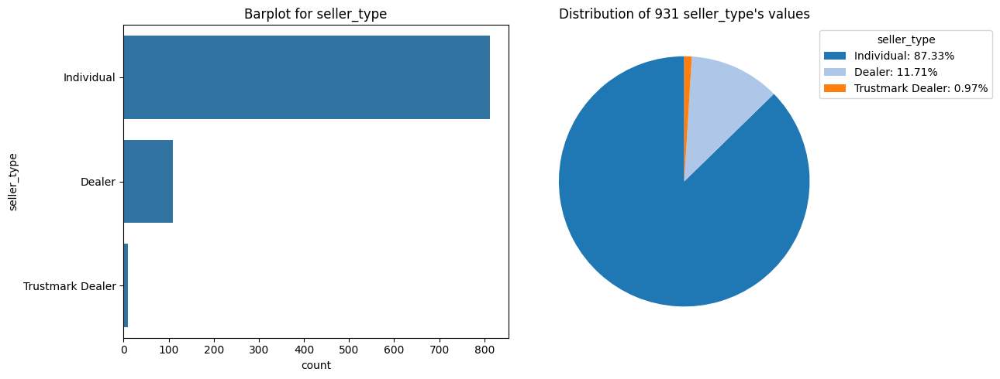

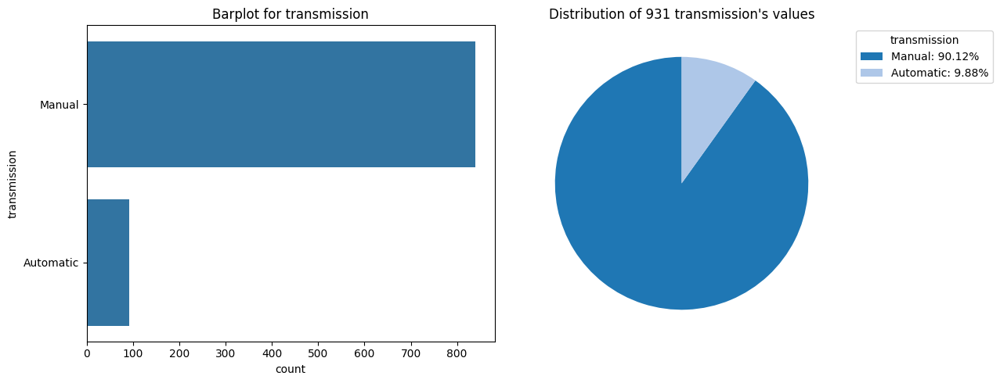

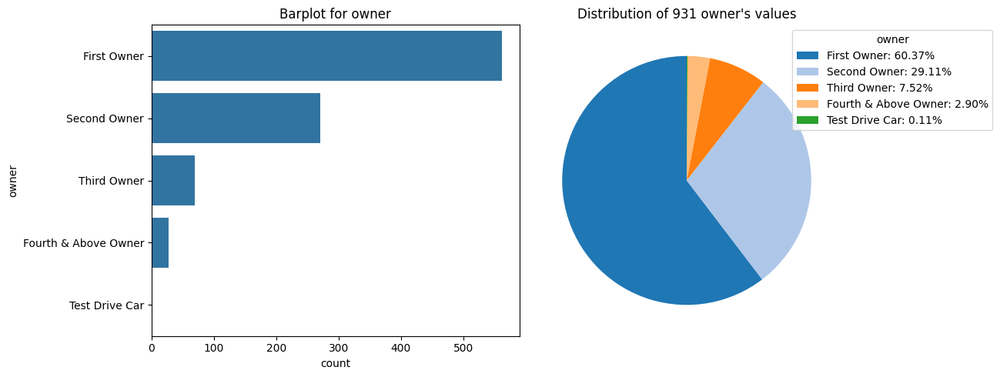

In [39]:
plotting_stat_graphs(df_test)

Мы ожидаемо получили схожие графики, что соответствует нашему анализу основных статистик

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

Отрисуем диаграммы рассеяния для всех количественных признаков

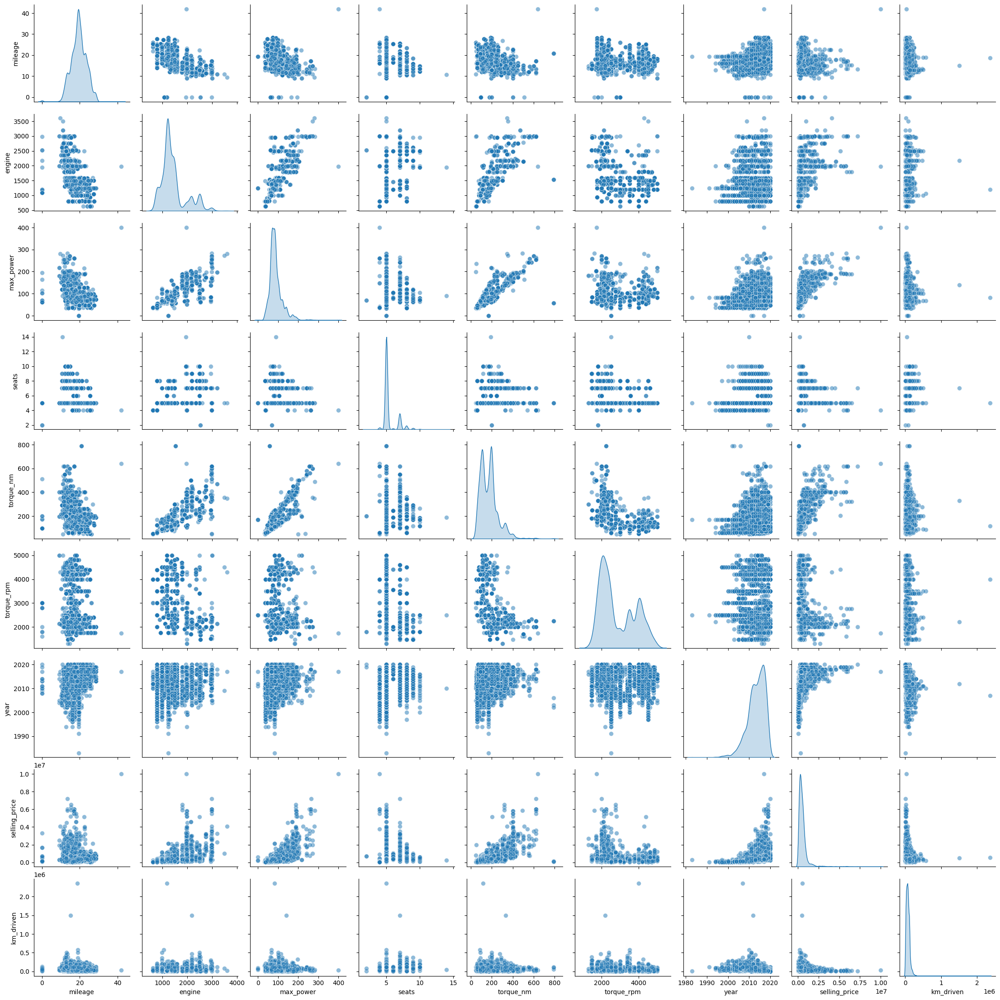

In [40]:
sns.pairplot(
    df_train.select_dtypes(include='number'),
    diag_kind='kde',
    plot_kws=dict(alpha=0.5, s=50)
)

plt.show()

> Можно ли предположить на основе распределений связь признаков с целевой переменной?
>
> Да, можно. Но это работает только с простыми связями, которые можно оценить визуально. Например, на нашей диаграмме можно наблюдать зависимость между ценой автомобиля и годом выпуска - новые автомобили дороже старых. В качетсве примера можно также обратить внимание на линейную зависимость между максимальной мощностью автомобиля и крутящим моментом

> Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?
>
> Да, можно, но только гипотезу - численный расчет всегда предпочтительнее. На графике видно есть ли закономерности в данных, которые и станут потом корреляцией. Например, исходя из нашей диаграммы можно ожидать высокой корреляции между целевым признаков и годом выпуска, между мощностью двигателя и крутящим моментом итд

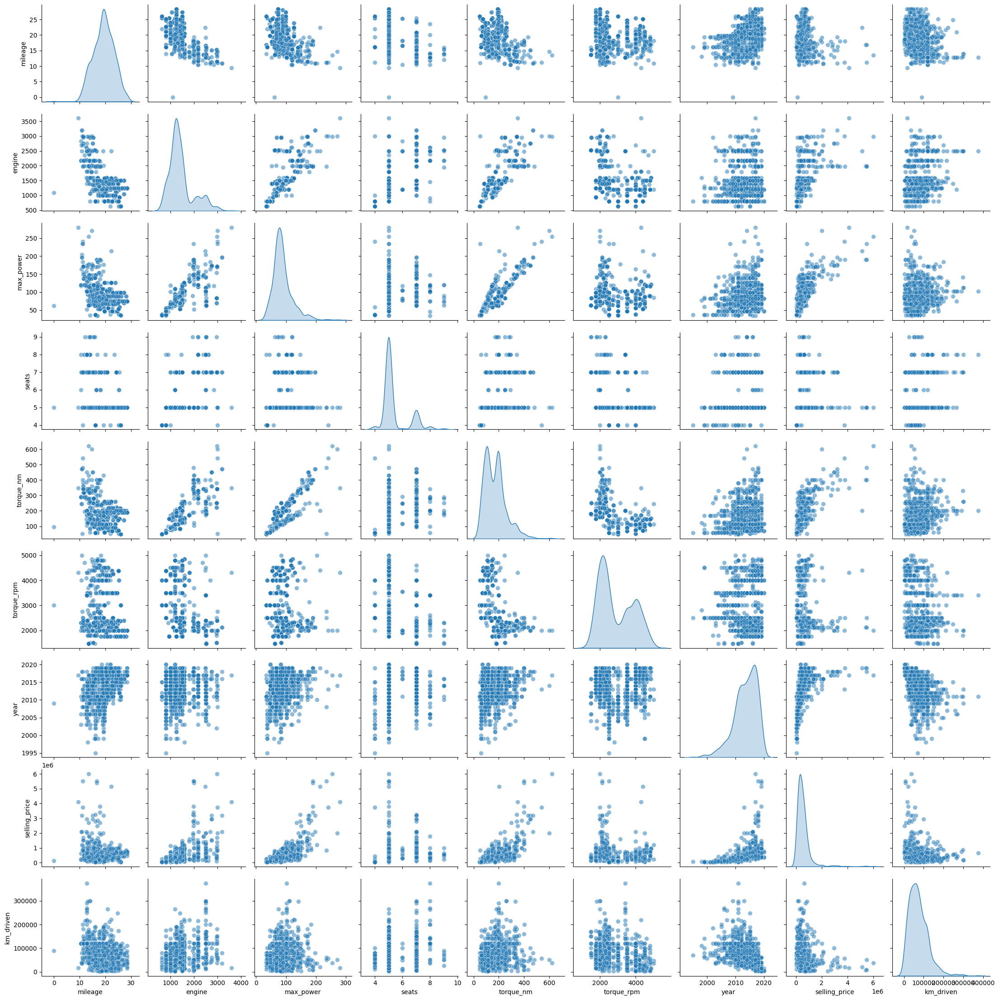

In [41]:
sns.pairplot(
    df_test.select_dtypes(include='number'),
    diag_kind='kde',
    plot_kws=dict(alpha=0.5, s=50)
)

plt.show()

> Похожими ли оказались совокупности при разделении на трейн и тест?
>
> Да, распределения похожи, что еще раз подтверждает корректность разбиения данных

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


Построим и визуализируем матрицу корреляции Пирсона. 

Примечание: Наши данные едва ли все имеют нормально распределение

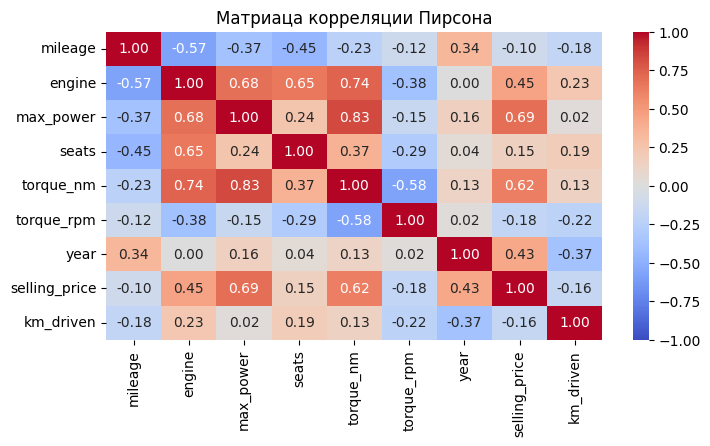

In [42]:
corr_mat = df_train.select_dtypes(include='number').corr()

plt.figure(figsize=(8, 4))
sns.heatmap(
    corr_mat, 
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    vmin=-1,
    vmax=1
)

plt.title('Матриаца корреляции Пирсона');

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

> Какие 2 признака наименее скоррелированы между собой?
>
> Наименьшая корреляция между годом и объемом двигателя - значение 0.00

> Между какими наблюдается довольно сильная положительная линейная зависимость?
>
> Та зависимость, что мы заметили на диаграмме рассеяния - зависимость между максимальной мощностью и крутящим моментом

> Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
>
> В нашей матрице коэффициент корреляции между этими признаками равен -0.37, что является умеренной отрицательной корреляцией. Чем меньше год выпуска, тем старше автомобиль, тем больше он в теории ездил, так что полученное значение имеет смысл.

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

Нам стоит добавить распределений целевого признака с раскрашиванием по категорям.

Отрисуем распределение с типом топлива

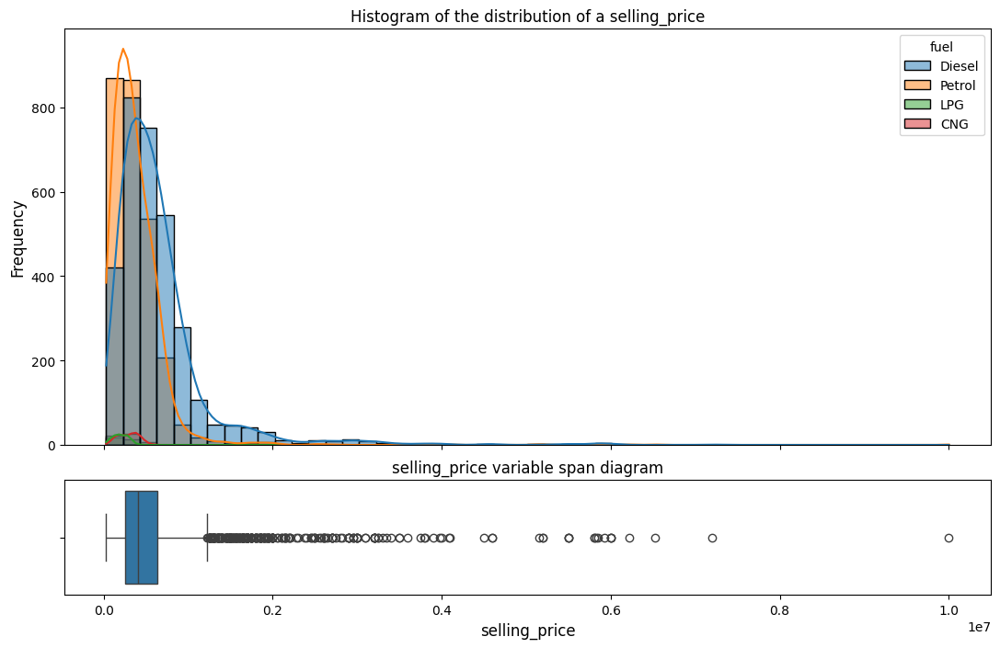

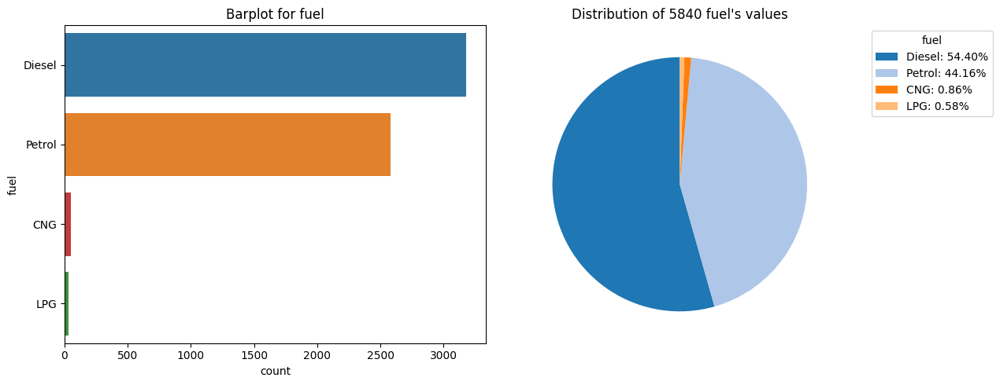

In [43]:
plotting_stat_graphs(df_train[['selling_price', 'fuel']], 'fuel')

Тут видно, что распределение цен на дизельные авто лежит правее, чем для бензиновых. По другим типам что-то сказать тяжело, так как данных слишком мало

Посмотрим На распределение для типа числа владельцов

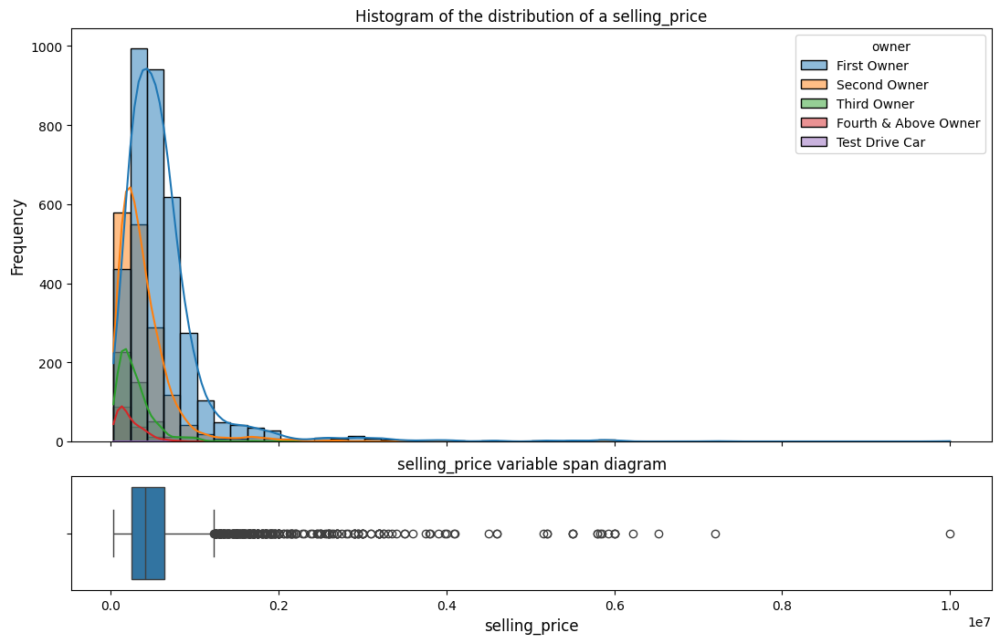

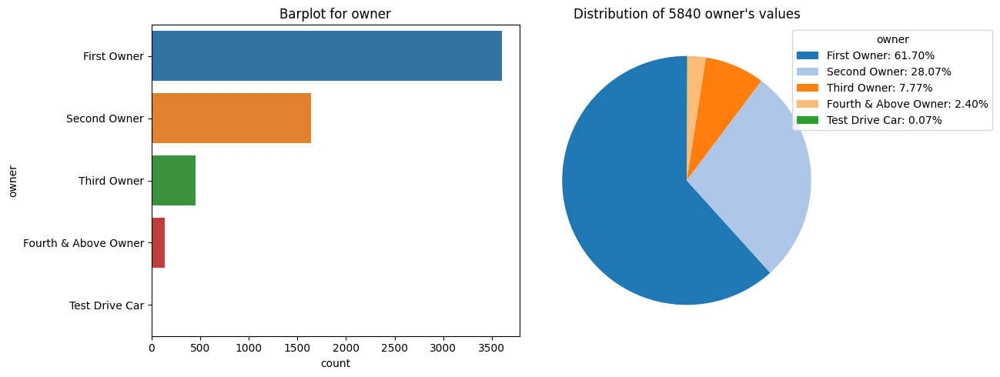

In [44]:
plotting_stat_graphs(df_train[['selling_price', 'owner']], 'owner')

Тут видим ождиаемую связь - чем больше владельцев, тем левее на графике цен лежат автомобили

Для того, чтобы была возможность оценить все связи в данных, а не только линейные между количественными признаками, стоит построить другую матрицу корреляции

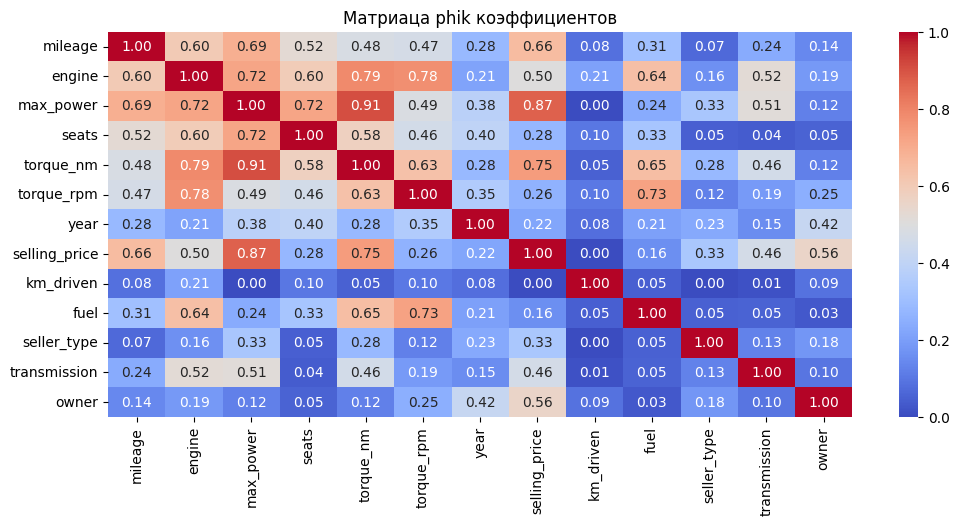

In [45]:
phik_mat = phik.phik_matrix(
    df_train.drop(columns=['name'], axis=1),
    interval_cols=df_train.select_dtypes(include='number').columns.difference(['seats'])
)

plt.figure(figsize=(12, 5))
sns.heatmap(
    phik_mat, 
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    vmin=0,
    vmax=1
)

plt.title('Матриаца phik коэффициентов');

In [46]:
phik_mat

,mileage,engine,max_power,seats,torque_nm,torque_rpm,year,selling_price,km_driven,fuel,seller_type,transmission,owner
mileage,1.000000,0.603733,0.692895,0.523548,0.480041,0.465492,0.283688,0.655490,0.082355,0.307497,0.070215,0.235764,0.144153
engine,0.603733,1.000000,0.720780,0.595357,0.786693,0.775507,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011
max_power,0.692895,0.720780,1.000000,0.719058,0.906338,0.487876,0.381639,0.872166,0.000000,0.236006,0.331904,0.511877,0.121438
seats,0.523548,0.595357,0.719058,1.000000,0.576979,0.460690,0.397253,0.276009,0.101441,0.327120,0.045938,0.037954,0.051505
torque_nm,0.480041,0.786693,0.906338,0.576979,1.000000,0.633382,0.283141,0.745238,0.049082,0.647568,0.284142,0.459875,0.121792
torque_rpm,0.465492,0.775507,0.487876,0.460690,0.633382,1.000000,0.352878,0.260799,0.103259,0.729835,0.121192,0.189878,0.246199
year,0.283688,0.213156,0.381639,0.397253,0.283141,0.352878,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636
selling_price,0.655490,0.503682,0.872166,0.276009,0.745238,0.260799,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641
km_driven,0.082355,0.210747,0.000000,0.101441,0.049082,0.103259,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887
fuel,0.307497,0.644421,0.236006,0.327120,0.647568,0.729835,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943


По такой матрице заметить оставшиеся связи будет уже проще

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [47]:
num_train = df_train.select_dtypes(include='number')
num_test = df_test[num_train.columns]

num_train.head()

,mileage,engine,max_power,seats,torque_nm,torque_rpm,year,selling_price,km_driven
0,23.40,1248,74.00,5,190.000000,2000.0,2014,450000,145500
1,21.14,1498,103.52,5,250.000000,2000.0,2014,370000,120000
2,23.00,1396,90.00,5,219.668960,2250.0,2010,225000,127000
3,16.10,1298,88.20,5,112.776475,4500.0,2007,130000,120000
4,20.14,1197,81.86,5,113.750000,4000.0,2017,440000,45000


In [48]:
y_train = num_train['selling_price']
X_train = num_train.drop(columns=['selling_price'], axis=1)

In [49]:
assert X_train.shape == (5840, 8) 

In [50]:
y_test = num_test['selling_price']
X_test = num_test.drop(columns=['selling_price'], axis=1)

In [51]:
assert X_test.shape == (931, 8) # у нас все-таки были дубликаты, которые мы удалили

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [52]:
lr = LinearRegression()

lr.fit(X_train, y_train)

lr_pred_train = lr.predict(X_train)
lr_pred_test = lr.predict(X_test)

get_metrics(y_train, lr_pred_train, y_test, lr_pred_test)

R^2 на тренировочных данных: 0.60302
R^2 на тестовых данных: 0.62589

MSE на тренировочных данных: 113789261591.89114
MSE на тестовых данных: 133960794112.44403
MAE на тестовых данных: 185781.75814

Cредняя цены на авто для трейна: 522960.0910958904


Мы получили не самые выдающиеся данные. Линейная регрессия объясняет только примерно 60% дисперсии цены. Ошибка MSE также велика. Стоит посмотреть на распределение ошибок по предсказаниям

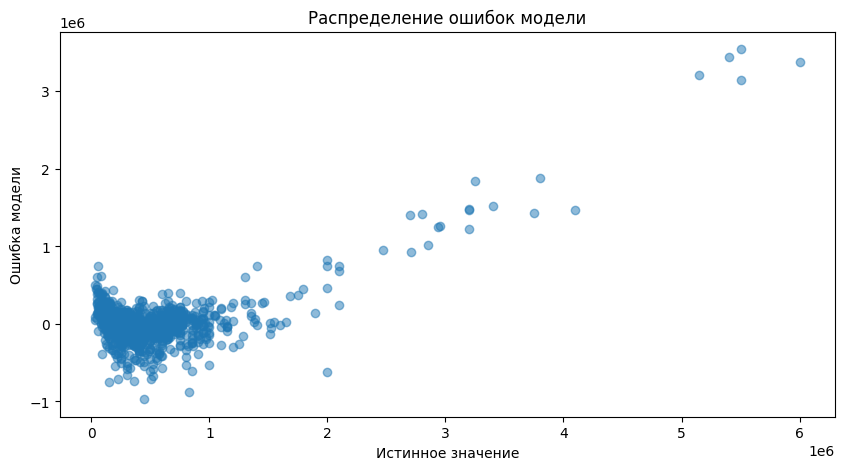

In [53]:
errors = y_test - lr_pred_test

plt.figure(figsize=(10, 5))
plt.scatter(y_test, errors, alpha=0.5)
plt.xlabel('Истинное значение')
plt.ylabel('Ошибка модели')
plt.title('Распределение ошибок модели');

Видим, что наша модель плохо научилась предсказывать машины дороже 1.5 млн, отсюда и такие метрики. Модель стоит улучшить

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [54]:
lr_scaled = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LinearRegression())
])

lr_scaled.fit(X_train, y_train)

lr_scaled_pred_train = lr_scaled.predict(X_train)
lr_scaled_pred_test = lr_scaled.predict(X_test)

get_metrics(y_train, lr_scaled_pred_train, y_test, lr_scaled_pred_test)

R^2 на тренировочных данных: 0.60302
R^2 на тестовых данных: 0.62589

MSE на тренировочных данных: 113789261591.89088
MSE на тестовых данных: 133960794112.44473
MAE на тестовых данных: 185781.75814

Cредняя цены на авто для трейна: 522960.0910958904


Стандартизация не улучшила модель линейной регрессии, так как эта модель инвариантна к линейным преобразованиям

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

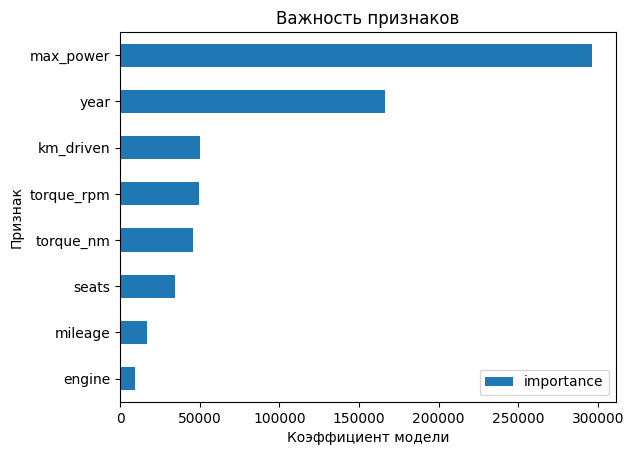

In [55]:
pd.DataFrame(
    np.abs(lr_scaled.named_steps['lr'].coef_),
    columns=['importance'],
    index=X_train.columns
).sort_values(by='importance').plot(
    kind='barh',
    xlabel='Коэффициент модели',
    title='Важность признаков',
    ylabel='Признак'
);

Самым важным признаков оказалась максимальная мощность

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

Для регуляризации нам важна стандартизация, чтобы признаки "наказывались" равномерно

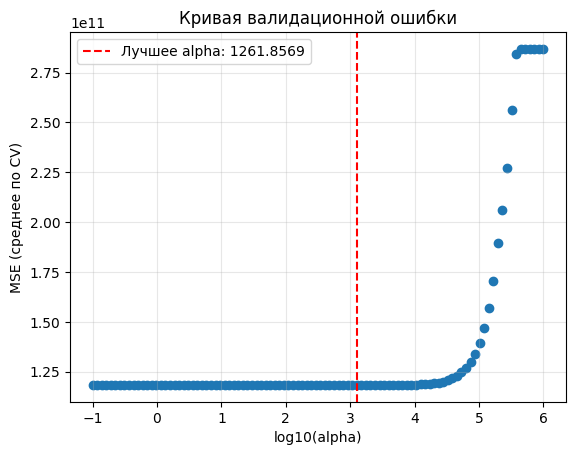

In [56]:
lasso_cv_scaled = Pipeline([
    ('scaler', StandardScaler()),
    ('lassoCV', LassoCV(cv=5, alphas=np.logspace(-1, 6, 100)))
])
 
lasso_cv_scaled.fit(X_train, y_train) 

mean_mse = lasso_cv_scaled.named_steps['lassoCV'].mse_path_.mean(axis=1)
plt.scatter(np.log10(lasso_cv_scaled.named_steps['lassoCV'].alphas_), mean_mse)
plt.axvline(
    np.log10(lasso_cv_scaled.named_steps['lassoCV'].alpha_), 
    color='r', 
    linestyle='--', 
    label=f'Лучшее alpha: {lasso_cv_scaled.named_steps['lassoCV'].alpha_:.4f}'
)
plt.xlabel('log10(alpha)')
plt.ylabel('MSE (среднее по CV)')
plt.title('Кривая валидационной ошибки')
plt.legend()
plt.grid(True, alpha=0.3)

In [57]:
lasso_pred_train = lasso_cv_scaled.predict(X_train)
lasso_pred_test = lasso_cv_scaled.predict(X_test)

get_metrics(y_train, lasso_pred_train, y_test, lasso_pred_test)

R^2 на тренировочных данных: 0.60294
R^2 на тестовых данных: 0.62492

MSE на тренировочных данных: 113811224302.57274
MSE на тестовых данных: 134307540158.37782
MAE на тестовых данных: 185129.14273

Cредняя цены на авто для трейна: 522960.0910958904


Посмотрим на важность признаков (на стандартизированных данных)

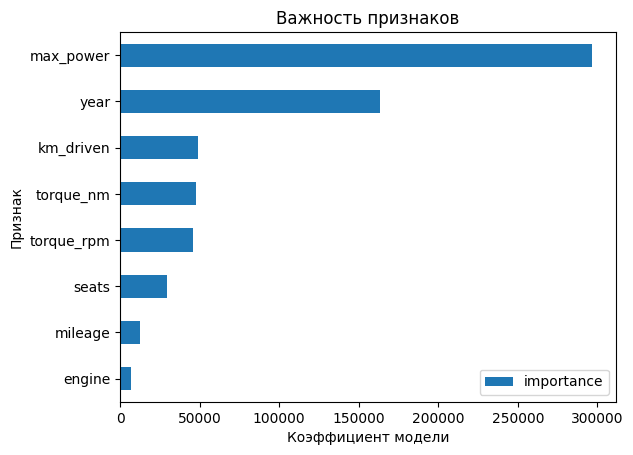

In [58]:
pd.DataFrame(
    np.abs(lasso_cv_scaled.named_steps['lassoCV'].coef_),
    columns=['importance'],
    index=X_train.columns
).sort_values(by='importance').plot(
    kind='barh',
    xlabel='Коэффициент модели',
    title='Важность признаков',
    ylabel='Признак'
);

Ни один из признаков не был занулен. При этом чем менее значим был признак, тем сильнее уменьшились его коэффициенты. 

Ни один из коэффициентов не был занулен, так как найденный лучший коэффициент alpha сильно меньше любого из весов, найденных без регуляризации, так что занулить их мы не можем

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

Попробуем еще раз найти оптимальный параметр для регуляризации

In [59]:
param_grid = {
    'lasso__alpha': np.logspace(-2, 6, 100)
}

In [60]:
lasso_scaled = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso())
])

In [61]:
grcv_lasso = GridSearchCV(
    lasso_scaled,
    param_grid=param_grid,
    cv=10,
    scoring='neg_mean_squared_error',
    verbose=1
)

In [62]:
grcv_lasso.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


,estimator,"Pipeline(step...o', Lasso())])"
,param_grid,{'lasso__alpha': array([1.0000...00000000e+06])}
,scoring,'neg_mean_squared_error'
,n_jobs,None
,refit,True
,cv,10
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [63]:
print(f'Лучшая метрика MSE: {-grcv_lasso.best_score_}')

Лучшая метрика MSE: 119175711279.83936


In [64]:
print(f'Оптимальное значение alpha: {grcv_lasso.best_params_['lasso__alpha']}')

Оптимальное значение alpha: 1484.9682622544665


In [65]:
lasso_pred_train = grcv_lasso.best_estimator_.predict(X_train)
lasso_pred_test = grcv_lasso.best_estimator_.predict(X_test)

get_metrics(y_train, lasso_pred_train, y_test, lasso_pred_test)

R^2 на тренировочных данных: 0.60292
R^2 на тестовых данных: 0.62474

MSE на тренировочных данных: 113819664468.44525
MSE на тестовых данных: 134372890498.00247
MAE на тестовых данных: 185022.57346

Cредняя цены на авто для трейна: 522960.0910958904


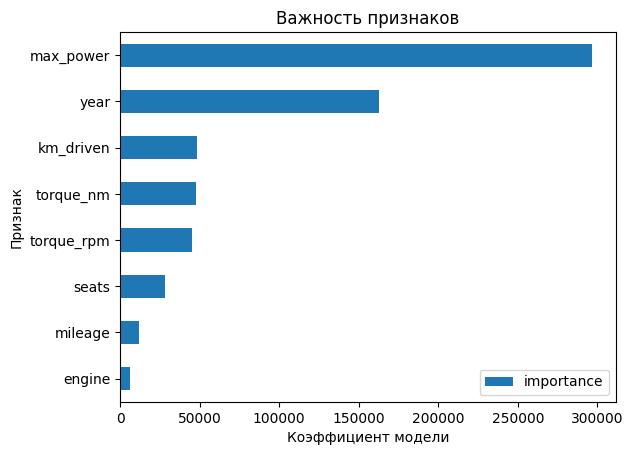

In [66]:
pd.DataFrame(
    np.abs(grcv_lasso.best_estimator_.named_steps['lasso'].coef_),
    columns=['importance'],
    index=X_train.columns
).sort_values(by='importance').plot(
    kind='barh',
    xlabel='Коэффициент модели',
    title='Важность признаков',
    ylabel='Признак'
);

Всего мы для 100 параметров обучили 10 моделей (по фолдам), итого 1000 обучений. При этом при увеличении числа фолдов с 5 до 10 мы получили схожее значение alpha, которое также не зануляет полностью коэффициенты признаков. 

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [67]:
param_grid = {
    'elasticnet__alpha': np.logspace(-2, 6, 100), 
    'elasticnet__l1_ratio': np.linspace(0, 1, 10)
}

In [68]:
elasticnet_scaled = Pipeline([
    ('scaler', StandardScaler()),
    ('elasticnet', ElasticNet())
])

In [69]:
grcv_elastic = GridSearchCV(
    elasticnet_scaled,
    param_grid=param_grid,
    cv=10,
    scoring='neg_mean_squared_error',
    verbose=1
)

In [70]:
grcv_elastic.fit(X_train, y_train)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


,estimator,Pipeline(step...lasticNet())])
,param_grid,"{'elasticnet__alpha': array([1.0000...00000000e+06]), 'elasticnet__l1_ratio': array([0. ..., 1. ])}"
,scoring,'neg_mean_squared_error'
,n_jobs,None
,refit,True
,cv,10
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [71]:
print(f'Лучшая метрика MSE: {-grcv_elastic.best_score_}')
print(f'Оптимальные параметры: {grcv_elastic.best_params_}')

Лучшая метрика MSE: 119111757489.31107
Оптимальные параметры: {'elasticnet__alpha': np.float64(0.03678379771828634), 'elasticnet__l1_ratio': np.float64(0.5555555555555556)}


In [72]:
elastic_pred_train = grcv_elastic.best_estimator_.predict(X_train)
elastic_pred_test = grcv_elastic.best_estimator_.predict(X_test)

get_metrics(y_train, elastic_pred_train, y_test, elastic_pred_test)

R^2 на тренировочных данных: 0.60269
R^2 на тестовых данных: 0.62492

MSE на тренировочных данных: 113884850937.68738
MSE на тестовых данных: 134305208869.26852
MAE на тестовых данных: 184206.78369

Cредняя цены на авто для трейна: 522960.0910958904


Здесь у нас больше параметров (добавилось 10 возможных значений l1_ratio), поэтому число итераций также увеличилось в 10 раз (до 10000). Лучшие значения: 

- alpha = 0.03678
- l1_ratio = 0.5556

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [73]:
# предобработаем

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

Давайте посмотрим на то, какие значения содержит столбец

In [74]:
df_train.name.head()

0           Maruti Swift Dzire VDI
1     Skoda Rapid 1.5 TDI Ambition
2        Hyundai i20 Sportz Diesel
3           Maruti Swift VXI BSIII
4    Hyundai Xcent 1.2 VTVT E Plus
Name: name, dtype: object

In [75]:
df_train.name.nunique()

1924

Действительно, есть 1924 уникальных значения. Но мы можем предположить, что первое слово в записях соответствует марке машины. Попробуем вытащить эту информацию

In [76]:
brand = df_train.name.str.split().str[0]

brand.head()

0     Maruti
1      Skoda
2    Hyundai
3     Maruti
4    Hyundai
Name: name, dtype: object

In [77]:
brand.nunique()

30

Так уже лучше - только 30 уникальных значений. Стоит посмотреть нет ли каких-то неверно обработанных строк

In [78]:
brand.value_counts()

name
Maruti           1804
Hyundai          1058
Mahindra          611
Tata              534
Toyota            309
Ford              308
Honda             308
Chevrolet         188
Renault           171
Volkswagen        153
Nissan             63
Skoda              61
Datsun             49
Mercedes-Benz      44
BMW                41
Fiat               39
Audi               31
Jeep               20
Mitsubishi          8
Volvo               8
Jaguar              7
Force               4
Isuzu               4
Land                3
Kia                 3
MG                  3
Ambassador          3
Daewoo              3
Lexus               1
Peugeot             1
Name: count, dtype: int64

У нас тут подозрительный 'Land'

In [79]:
df_train[brand == 'Land']

,mileage,engine,max_power,seats,torque_nm,torque_rpm,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
120,12.83,1999,148.31,7,382.0,2000.0,Land Rover Discovery Sport TD4 SE,2019,4500000,21000,Diesel,Dealer,Automatic,First Owner
1660,0.00,2179,115.00,5,400.0,2000.0,Land Rover Freelander 2 TD4 HSE,2013,1650000,64788,Diesel,Dealer,Automatic,First Owner
4874,12.70,2179,187.70,5,420.0,2000.0,Land Rover Range Rover Evoque 2.2L Pure,2013,2000000,77500,Diesel,Individual,Automatic,Third Owner


Это остаток от 'Land Rover'. Таких значений немного, так что для красоты можем дополнить

In [80]:
brand[brand == 'Land'] = 'Land Rover'

Теперь заменим исходный столбец

In [81]:
df_train.name = brand

Аналогичные действия проведем с df_test

In [82]:
df_test.name.str.split().str[0].value_counts()

name
Maruti           276
Hyundai          191
Tata             100
Mahindra          88
Toyota            51
Ford              50
Honda             50
Renault           29
Chevrolet         23
Volkswagen        13
Nissan            11
Skoda             10
Datsun             7
BMW                6
Volvo              4
Mercedes-Benz      4
Jeep               3
Mitsubishi         3
Jaguar             3
Fiat               3
Audi               2
Lexus              1
Ambassador         1
Opel               1
Ashok              1
Name: count, dtype: int64

In [83]:
df_test.name = df_test.name.str.split().str[0]

In [84]:
# assert X_train_cat.shape == (5840, 10)

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [85]:
y_train_all = df_train['selling_price']
X_train_all = df_train.drop(columns=['selling_price'], axis=1)

y_test_all = df_test['selling_price']
X_test_all = df_test.drop(columns=['selling_price'], axis=1)

In [86]:
categorical_columns = (
    X_train_all
    .select_dtypes(exclude='number')
    .columns.tolist()
) + ['seats']

numeric_columns = (
    X_train_all
    .select_dtypes(include='number')
    .columns
    .difference(['seats']).tolist()
)

In [87]:
print(f'Числовые столбцы: {numeric_columns}')
print(f'Категориальные столбцы: {categorical_columns}')

Числовые столбцы: ['engine', 'km_driven', 'max_power', 'mileage', 'torque_nm', 'torque_rpm', 'year']
Категориальные столбцы: ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']


In [88]:
ohe = OneHotEncoder(
    drop='first',
    sparse_output=False, 
    handle_unknown='ignore'
)

ct = ColumnTransformer([
    ('ohe', ohe, categorical_columns),
    ('scaler', StandardScaler(), numeric_columns)
], remainder='passthrough')

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [89]:
ridge_pipe = Pipeline([
    ('transformer', ct),
    ('ridge', Ridge())
])

In [90]:
param_grid = {'ridge__alpha': np.logspace(-4, 6, 200)}

In [91]:
grcv_ridge = GridSearchCV(
    ridge_pipe,
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    verbose=1
)

In [92]:
grcv_ridge.fit(X_train_all, y_train_all)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits


,estimator,"Pipeline(step...e', Ridge())])"
,param_grid,{'ridge__alpha': array([1.0000...00000000e+06])}
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,10
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,transformers,"[('ohe', ...), ('scaler', ...)]"


In [93]:
print(f'Лучшая метрика R2: {grcv_ridge.best_score_}')
print(f'Оптимальные параметры: {grcv_ridge.best_params_}')

Лучшая метрика R2: 0.7149473406779617
Оптимальные параметры: {'ridge__alpha': np.float64(1.8679135990207847)}


In [94]:
ridge_pred_train = grcv_ridge.best_estimator_.predict(X_train_all)
ridge_pred_test = grcv_ridge.best_estimator_.predict(X_test_all)

get_metrics(y_train_all, ridge_pred_train, y_test_all, ridge_pred_test)

R^2 на тренировочных данных: 0.77166
R^2 на тестовых данных: 0.77422

MSE на тренировочных данных: 65451810026.44417
MSE на тестовых данных: 80847977214.81412
MAE на тестовых данных: 142886.19655

Cредняя цены на авто для трейна: 522960.0910958904


Для Ridge регуляризации подобрали параметр alpha = 1.8679

Для него заметно улучшилась метрика R2 - до 0.77 на тестовых данных. При этом и MSE уменьшилась почти в 1.5 раза. В среднем модель ошибается на 142 тысячи для каждого автомобиля

Посмотрим на остатки для найденной модели

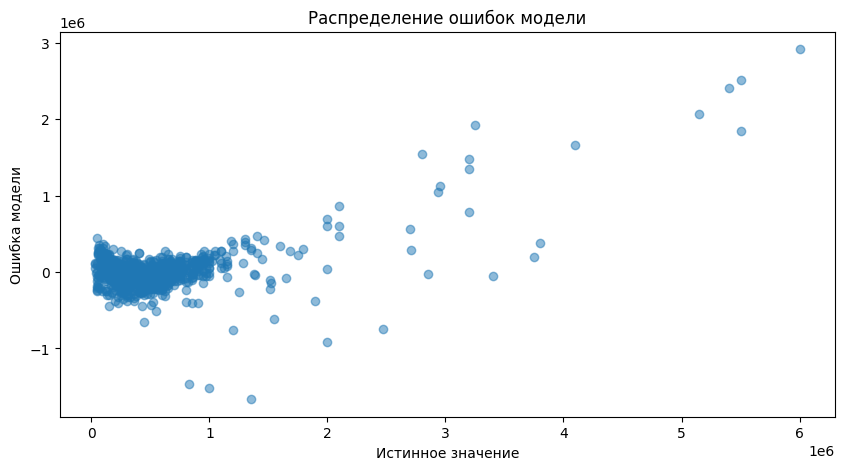

In [95]:
errors = y_test - ridge_pred_test

plt.figure(figsize=(10, 5))
plt.scatter(y_test, errors, alpha=0.5)
plt.xlabel('Истинное значение')
plt.ylabel('Ошибка модели')
plt.title('Распределение ошибок модели');

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [96]:
def business_metric(y_true, y_pred):
    
    metric = (y_true * 0.9 <= y_pred) & (y_pred <= 1.1 * y_true)
    
    return metric.mean()

Теперь проверим наши найденные модели с этой метрикой. Финальную проверку делаем на тестовых данных

In [97]:
models = {
    'Linear Regression without scaling': business_metric(y_test, lr_pred_test),
    'Linear Regression with scaling': business_metric(y_test, lr_scaled_pred_test),
    'Lasso Regression with scaling': business_metric(y_test, lasso_pred_test),
    'ElasticNet Regression with scaling': business_metric(y_test, elastic_pred_test),
    'Ridge Regression with scaling': business_metric(y_test_all, ridge_pred_test)
}

for name, score in models.items():
    print(f'{name:>40}: {score:>25}')


       Linear Regression without scaling:       0.24274973147153597
          Linear Regression with scaling:       0.24274973147153597
           Lasso Regression with scaling:       0.23952738990332975
      ElasticNet Regression with scaling:       0.24812030075187969
           Ridge Regression with scaling:       0.29860365198711064


Лучшей с точки зрения бизнес-метрики осталась лучшая модель Ridge регрессии, построенной на всех данных

Сохраним лучшую модель

In [98]:
with open('best_model_ridge.pickle', 'wb') as f:
    pickle.dump(grcv_ridge.best_estimator_, f)

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 18 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)
